In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn


In [3]:
print(torch.__version__)
print(torch.cuda.is_available())
device = torch.device("cuda")

2.4.0
True


(32,)


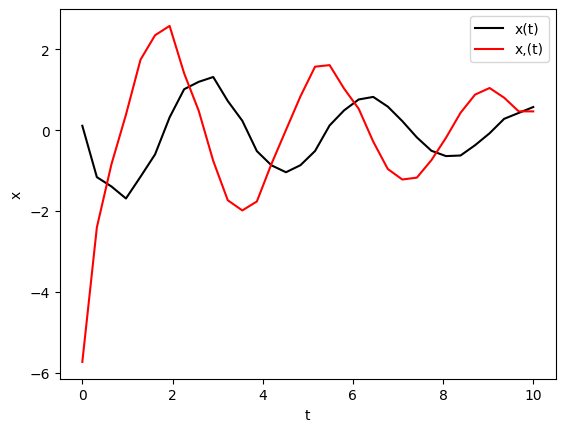

In [30]:
t = np.linspace(0, 10, 32) 
dt = 10 / (32)
data = np.load('ode_Inverse_t_noise0.01.npy').ravel()
print(data.shape)
gradient_t = np.gradient(data, dt, edge_order= 2)

plt.plot(t, data, color = 'k', label = 'x(t)')
plt.plot(t, gradient_t, color = 'r', label = 'x,(t)')
plt.legend(loc = 'upper right')
plt.xlabel('t')
plt.ylabel('x')
plt.show()

data = torch.from_numpy(data)
t = torch.from_numpy(t)
gradient_t = torch.from_numpy(gradient_t)

t = t.float().to(device)
data = data.float().to(device)
gradient_t = gradient_t.float().to(device)


In [31]:
data = data.reshape(32, 1)
t = t.reshape(32, 1)

In [32]:
#обучение на одном интеграле с early stopping на loss и на градиенты и с динамическим lr(лучше по t, те ouput1)
import torch.optim as optim

# Определение модели
model = torch.nn.Sequential(
    torch.nn.Linear(1, 32),
    torch.nn.ReLU(),
    torch.nn.Linear(32, 512),
    torch.nn.ReLU(),
    torch.nn.Linear(512, 256),
    torch.nn.ReLU(),
    torch.nn.Linear(256, 128),
    torch.nn.ReLU(),
    torch.nn.Linear(128, 64),
    torch.nn.ReLU(),
    torch.nn.Linear(64, 32),
    torch.nn.ReLU(),
    torch.nn.Linear(32, 16),
    torch.nn.ReLU(),
    torch.nn.Linear(16, 8),
    torch.nn.ReLU(),
    torch.nn.Linear(8, 1)
).to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2000, factor=0.7)

grid_points = t.reshape(-1, 1).to(device)

def integrate_gradients(dx, initial_value):
    integral_x = torch.zeros_like(dx)
    integral_x[0] = initial_value 
    for i in range(1, dx.shape[0]):
        integral_x[i] = integral_x[i - 1] + (((dx[i] + dx[i - 1])) * dt) / 2  
    return integral_x

losses = []
initial_value = data[0]
best_loss = float('inf')#хранит наименьшее значение потерь, достигнутое моделью. Изначально оно установлено в бесконечность
patience_counter = 0#отслеживает количество эпох с ухудшением потерь.
patience_limit = 40000  #задает максимальное количество эпох без улучшения, после которого обучение будет остановлено.
target_accuracy = 0.0005  # желаемая точность

for epoch in range(400000):
    optimizer.zero_grad()
    output = model(grid_points).reshape(32, 1).to(device)
    integral = integrate_gradients(output, initial_value).to(device)
    loss = criterion(integral, data)                                                   
    loss.backward()                                                                   
    optimizer.step()                                                                  
    # Динамическое изменение learning rate
    scheduler.step(loss)#позволяет планировщику изменять learning rate на основе текущих потерь. Если потери не улучшаются в течение заданного количества эпох (patience), learning rate уменьшается на указанный фактор.
    losses.append(loss.item())                                                        
    print(f'Epoch {epoch}, Loss: {loss.item()}')
    # Ранняя остановка
    if loss.item() < best_loss:#Если текущие потери меньше, чем best_loss, то обновляем best_loss и сбрасываем patience_counter.
        best_loss = loss.item()
        patience_counter = 0
        # Сохранение модели (если нужно)
        # torch.save(model.state_dict(), 'best_model.pth')
    else:
        patience_counter += 1#Если текущие потери не улучшаются, увеличиваем patience_counter.
        
        if patience_counter >= patience_limit:#Если patience_counter достигает patience_limit, выводим сообщение о срабатывании ранней остановки и прерываем цикл обучения.
            print("Early stopping triggered.")
            break

print(output.shape)



Epoch 0, Loss: 1.1980628967285156
Epoch 1, Loss: 1.1223993301391602
Epoch 2, Loss: 1.0472371578216553
Epoch 3, Loss: 0.963546097278595
Epoch 4, Loss: 0.871329665184021
Epoch 5, Loss: 0.7784972786903381
Epoch 6, Loss: 0.6999754905700684
Epoch 7, Loss: 0.6733963489532471
Epoch 8, Loss: 0.7301970720291138
Epoch 9, Loss: 0.7541043162345886
Epoch 10, Loss: 0.7213621735572815
Epoch 11, Loss: 0.6826337575912476
Epoch 12, Loss: 0.6646943688392639
Epoch 13, Loss: 0.6668993830680847
Epoch 14, Loss: 0.677407443523407
Epoch 15, Loss: 0.6862981915473938
Epoch 16, Loss: 0.6891863942146301
Epoch 17, Loss: 0.6856030225753784
Epoch 18, Loss: 0.6775299906730652
Epoch 19, Loss: 0.6675732135772705
Epoch 20, Loss: 0.6588029861450195
Epoch 21, Loss: 0.6540658473968506
Epoch 22, Loss: 0.6546685695648193
Epoch 23, Loss: 0.6585325002670288
Epoch 24, Loss: 0.6612215042114258
Epoch 25, Loss: 0.6599645614624023
Epoch 26, Loss: 0.6555062532424927
Epoch 27, Loss: 0.6504442095756531
Epoch 28, Loss: 0.646787524223327

10.460301


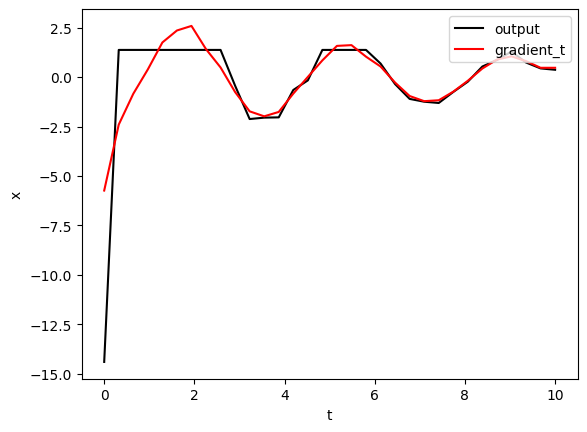

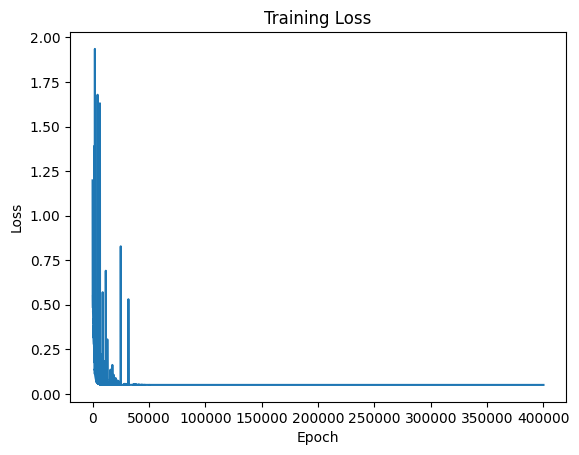

In [33]:
output = output.detach().cpu().numpy() 
t =  t.detach().cpu().numpy() 
data = data.detach().cpu().numpy() 
gradient_t = gradient_t.detach().cpu().numpy() 
print((np.square(output - gradient_t)).mean(axis=None))

plt.plot(t, output, color = 'k', label = 'output')
plt.plot(t, gradient_t, color = 'r', label = 'gradient_t')
plt.legend(loc = 'upper right')
plt.xlabel('t')
plt.ylabel('x')
plt.show()

plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

In [34]:
np.save('ode_Inverse_tt_noise0.01.npy', output)

: 

In [3]:
t = np.linspace(0, 10, 32) 
step = 10 / (32)
data = np.load('data_ode_noise0.npy')
gradient_t = np.gradient(data, step, edge_order=2)
gradient_tt = np.gradient(gradient_t, step, edge_order=2)

0.000940540833460488


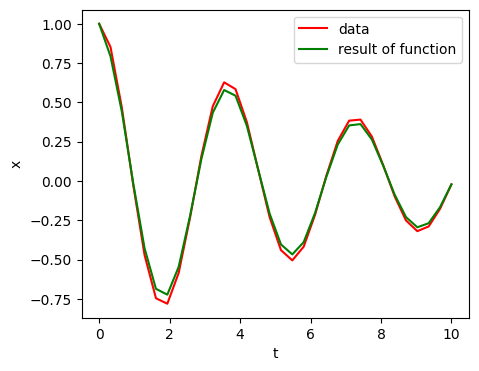

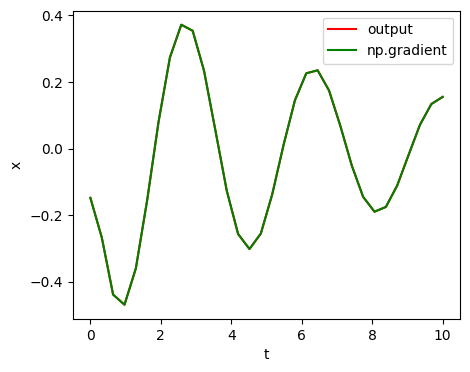

In [6]:
import numpy as np

# Функция для вычисления производных
def compute_gradients(data):
    dt = np.gradient(data) 
    return dt

def integrate_gradients(dx, initial_value):
    
    integral_x = np.zeros_like(dx)
    integral_x[0] = initial_value 
    for i in range(1, dx.shape[0]):
        integral_x[i] = integral_x[i - 1] + (((dx[i] + dx[i - 1])) )/ 2
    return integral_x

dt = compute_gradients(data)
#dt = np.load('ode_Inverse_t_noise0.npy')

initial_value = data[0]

result1 = integrate_gradients(dt, initial_value)

print((np.square(data - result1)).mean(axis=None))

plt.figure(1, figsize = (5,4))
plt.plot(t, data, color = 'r', label = 'data')
plt.plot(t, result1, color = 'g', label = 'result of function')
plt.legend(loc = 'upper right')
plt.xlabel('t')
plt.ylabel('x')
plt.show()

plt.figure(1, figsize = (5,4))
plt.plot(t, dt, color = 'r', label = 'output')
plt.plot(t, np.gradient(data), color = 'g', label = 'np.gradient')
plt.legend(loc = 'upper right')
plt.xlabel('t')
plt.ylabel('x')
plt.show()
